In [1]:
import numpy as np
import pandas as pd
import re

import matplotlib.pyplot as plt
import plotly
import plotly.graph_objects as go

#import ipdb
import joblib

import progressbar

In [2]:
import sklearn.decomposition
import scipy
import re

# Thoughts

1. objects are 36 hours long (Y is 12 hours, X is 24 hours)

  a. since recording are collected in 30 min intervals, X observations have 48 points time points and Y have 24 time points.
  
  b. observations have ~ 600/5 (120) radius values.

# Exploration of data

In [3]:
tc_rad = pd.read_csv("../data/size_and_radial_prof/AL122005_rad.csv", skiprows = 1)

In [4]:
values_only = ["RAD"+re.sub("\.0","",rad) for rad in list(tc_rad.columns)[1:]]
new_cols = ["time"] + values_only

In [5]:
tc_rad = tc_rad.drop(axis = 0, index = 0)

new_column_dict = dict(zip(list(tc_rad.columns),
                           list(new_cols)
                           ))

tc_rad = tc_rad.rename(columns = new_column_dict)

In [6]:
tc_rad_mat = np.array(tc_rad[values_only])

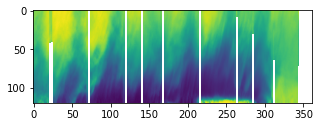

In [7]:
fig, ax = plt.subplots(figsize = (5,12))
ax.imshow(tc_rad_mat.T[::-1])

In [8]:
fig = go.Figure(data=[go.Surface(z=tc_rad_mat)])

fig.update_layout(title='Hurricane Katrina', autosize=False,
                  width=500, height=500,
                  margin=dict(l=65, r=50, b=65, t=90))

fig.show()

## quick and dirty linear filling

Figure out which rows are missing (fill any one)

In [9]:
na_info = np.isnan(tc_rad_mat).mean(axis = 1)

In [10]:
if (na_info == 1)[-1]:
    empty_final_rows = np.sum(np.cumsum((na_info > 0)[::-1]) == \
                          np.arange(1,na_info.shape[0]+1, dtype = int))

In [11]:
empty_final_rows

18

In [12]:
tc_rad

,time,RAD5,RAD10,RAD15,RAD20,RAD25,RAD30,RAD35,RAD40,RAD45,...,RAD555,RAD560,RAD565,RAD570,RAD575,RAD580,RAD585,RAD590,RAD595,RAD600
1,2005-08-23 18:00:00.000000000,-13.416660,-12.960708,-13.127672,-17.351383,-17.122209,-18.451186,-19.061516,-20.235013,-22.977803,...,-1.088628,-1.042144,-1.328343,-1.203733,-1.508591,-1.691991,-1.399073,-0.869567,-0.043693,-0.349973
2,2005-08-23 18:30:00.000013000,-26.399994,-22.760708,-24.874993,-24.608183,-23.907949,-23.471685,-22.804245,-22.807195,-22.544538,...,0.765251,0.691703,0.261413,-0.282271,-0.494454,-0.968709,-0.677600,-0.904463,0.060790,-0.018952
3,2005-08-23 19:00:00.000027000,-31.212494,-31.614280,-28.958327,-25.324741,-26.480947,-25.240331,-25.033572,-24.147614,-24.746983,...,0.547224,1.020589,1.105514,1.097235,0.886250,1.499268,0.183904,-0.352554,-0.100669,0.272539
4,2005-08-23 19:30:00.000000000,-37.379160,-35.062493,-32.626184,-30.439738,-27.741694,-26.054014,-26.676849,-26.064879,-26.546282,...,-1.823563,-0.354699,0.935161,1.777509,1.652550,1.483998,1.031609,0.907322,1.084468,0.962870
5,2005-08-23 20:00:00.000013000,-36.233327,-35.183327,-34.399993,-30.324237,-29.071697,-27.986801,-29.979545,-29.674841,-30.329027,...,-3.900718,-1.913644,-0.195418,0.574309,1.340118,1.440384,1.022119,1.429201,1.369078,1.333935
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
358,2005-08-31 04:30:00.000000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
359,2005-08-31 05:00:00.000013000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
360,2005-08-31 05:30:00.000027000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
361,2005-08-31 06:00:00.000000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [13]:
tc_rad_clean = tc_rad.drop(
    list(np.arange(na_info.shape[0]-empty_final_rows+1, 
                   na_info.shape[0]+1)))

tc_rad_mat_clean = tc_rad_mat = np.array(tc_rad_clean[values_only])

## linear update

In [14]:
na_info_clean = np.isnan(tc_rad_mat_clean).mean(axis = 1)

In [15]:
mat = tc_rad_mat_clean
na_vec = na_info_clean

In [16]:
# to do: linear translate
# a. identify start and stop of na blocks
def linear_interp(mat, na_vec):
    assert mat.shape[0] == na_vec.shape[0], \
        "expect mat rows and na_vec to have same number of obs"
    
    # track beginning and end of missing data segments
    out_mat = mat.copy()
    starts = []
    ends = []
    tracking_sequence = False
    for right in range(na_vec.shape[0]):
        current_nas = na_vec[right]
        if tracking_sequence:
            if not current_nas:
                ends += [right-1]
        else:
            if current_nas:
                starts += [right]

        tracking_sequence = current_nas
        
    # calculate length of these segments
    ends_np = np.array(ends)
    starts_np = np.array(starts)
    len_segments = ends_np-starts_np + 1
        
    for segment_idx in np.arange(starts_np.shape[0]):
        
        before = mat[starts_np[segment_idx]-1,:]
        after = mat[ends_np[segment_idx]+1,:]
        current_length = len_segments[segment_idx]
        
        
        for update_idx, update_row_idx in \
            enumerate(np.arange(starts_np[segment_idx], 
                                ends_np[segment_idx]+1)):
            inner_frac = (update_idx + 1)/(current_length + 1)
            out_mat[update_row_idx,:] = inner_frac*after + (1-inner_frac)*before
    
    return out_mat
            

In [59]:
def test_linear_interp():
    """
    static test for linear_interp
    """
    
    mat = np.arange(24*5).reshape(30,4)
    na_vec = np.array([0,0,0,0,.1,.1,.1,0,0,0,
                       0,0,0,1,0,0,0,0,1,1,
                       0,0,0,0,0,0,0,0,0,0])
    assert np.all(linear_interp(mat, na_vec) == mat), \
        "expect similar linear progression to be correctly filled in"
    
    mat2 = np.array(mat.copy(), dtype = float)
    mat2[3:8,:] = mat2[3:8,:]*np.random.uniform(size = 1)
    
    assert np.all(np.abs(linear_interp(mat2, na_vec) - mat2)<1e-14), \
        "expect similar linear progression to be correctly filled in"+\
        "(non unit jump check)"
    
test_linear_interp()

In [18]:
updated = linear_interp(mat, na_vec)

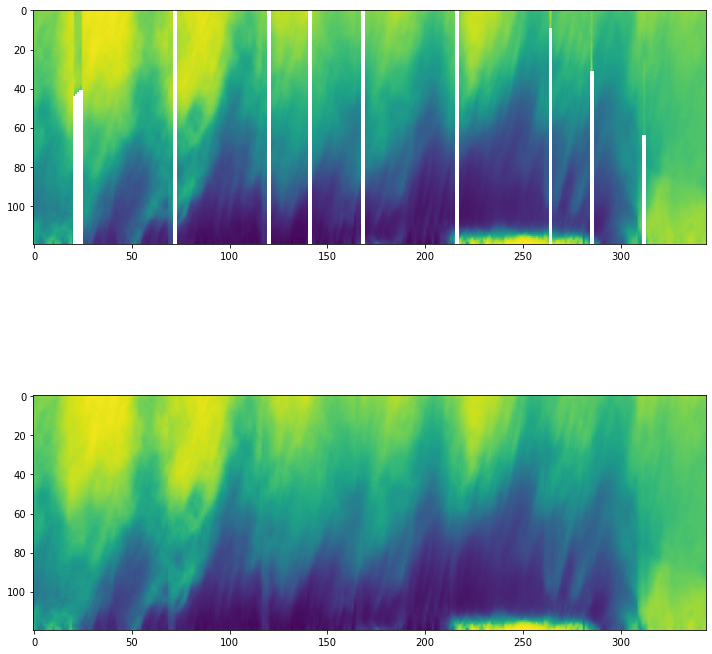

In [19]:
fig, ax = plt.subplots(nrows = 2, figsize = (10,12))
ax[0].imshow(mat.T[::-1])
ax[1].imshow(updated.T[::-1])
fig.tight_layout()

In [20]:
fig = go.Figure(data=[go.Surface(z=updated)])

fig.update_layout(title='Hurricane Katrina', autosize=False,
                  width=500, height=500,
                  margin=dict(l=65, r=50, b=65, t=90))

fig.show()

# Difusion mapping and Meanshift 

Seems like meanshift is going to be complicated - unless we do it on the original space (which should be slow mathematically)

In [21]:
import sklearn
import sklearn.datasets

In [22]:
# demo distance matrix
X,_ = sklearn.datasets.make_moons(400,noise = .075)

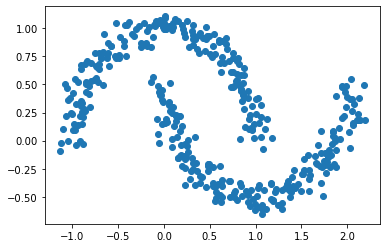

In [23]:
plt.scatter(X[:,0], X[:,1])

In [24]:
dmat = scipy.spatial.distance_matrix(X,X)

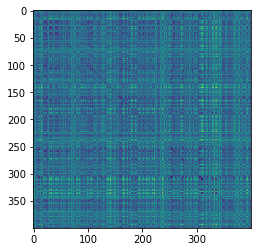

In [25]:
plt.imshow(dmat)

In [26]:
def diffusion_map(dmat, sigma = 1, 
                  power = 1, n_comps = None):
    if n_comps is None:
        n_comps = dmat.shape[0]
    
    P = np.exp(-dmat**2 / sigma**2)
    
    P_pow = P.copy()
    if power > 1:
        for _ in range(power-1): 
            P_pow = np.matmul(P_pow,P)
            
    # SVD
    svd = sklearn.decomposition.PCA(n_components = n_comps)
    Xcompress = svd.fit_transform(P_pow)
    
    return Xcompress
    
def test_diffusion_map():
    X,y = sklearn.datasets.make_moons(400,noise = .075)
    dmat = scipy.spatial.distance_matrix(X,X)
    
    Xcompress = diffusion_map(dmat)

In [27]:
X,y = sklearn.datasets.make_moons(400,noise = .075)
dmat = scipy.spatial.distance_matrix(X,X)

Xcompress = diffusion_map(dmat, sigma = .25, power = 5)

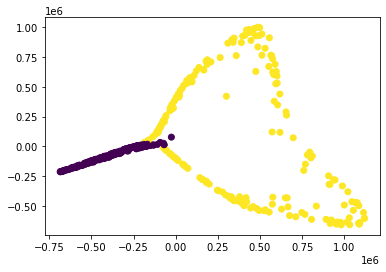

In [28]:
plt.scatter(Xcompress[:,0], 
            Xcompress[:,1], 
            c = y)

In [29]:
from sklearn.cluster import MeanShift

In [30]:
clustering = MeanShift().fit(Xcompress[:,:3])

In [31]:
Xcompress[:,:2].shape

(400, 2)

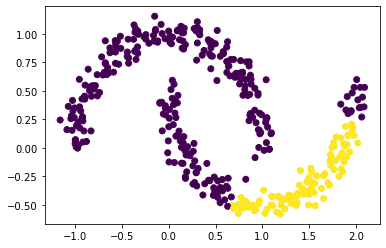

In [32]:
plt.scatter(X[:,0], X[:,1], c = clustering.labels_)

## Meanshift in true space

In [33]:
def l2_dist(mat1, mat2):
    """
    calculate l2 distance between two matrices
    
    Arguments:
    ----------
    mat1: numpy array (n, p)
    mat2: numpy array (n, p)
    
    Returns:
    --------
    l2 distance between matrices
    """
    assert len(mat1.shape) == 2, \
        "mat1/mat2 should be 2d matrices"
    assert mat1.shape == mat2.shape, \
        "matrix shapes must be the same"
    return np.sqrt(np.sum((mat1-mat2)**2))

def l2_dist_lots2one(mat1, data_array):
    """
    calculate l2 distance between a matrix and an array of matrices
    
    Arguments:
    ----------
    mat1: numpy array (n, p)
    data_array: numpy array (r,n,p) treat each row (relative to first index) 
        as a new matrix
    
    Returns:
    --------
    numpy array (r,) of l2 distances between mat1 and data_array[r]
    
    
    """
    assert len(mat1.shape) == 2 and len(data_array.shape) == 3, \
        "mat1 should be 2d and data_array should be 3d"
    assert mat1.shape == data_array.shape[1:], \
        "matrix and data_array columns must be the same shape"
    
    mat1_array = np.tile(mat1.reshape(1,mat1.shape[0], mat1.shape[1]), 
                         (data_array.shape[0],1,1))
    
    return np.sqrt(np.sum((mat1_array-data_array)**2, axis = (1,2)))
    

In [34]:
def test_l2_dist():
    """
    test l2_dist function (basic)
    """
    # same matrix
    mat1 = np.random.normal(size = 20).reshape((4,5))
    assert l2_dist(mat1, mat1) == 0, \
        "distance between self should be 0"
    
    # random
    mat2 = np.random.normal(size = 20).reshape((4,5))
    assert l2_dist(mat1, mat2) >= 0, \
        "distance between two random matrices should be greater than"+\
        "or equal to 0"
    
    # static
    mat1 = np.arange(20).reshape((4,5))
    mat2 = mat1.copy()
    mat2[0,0] = 20
    assert l2_dist(mat1, mat2) == 20, \
        "static distance test didn't correctly work"

test_l2_dist()
    
def test_l2_dist_lots2one():
    """
    test l2_dist_lots2one function
    """
    
    data_array = np.random.normal(size = 5*20).reshape(5,4,5)
    mat1 = data_array[0]
    assert l2_dist_lots2one(mat1, data_array)[0] == 0, \
        "l2_dist_lots2one: distance between self should be 0"
    assert np.all(l2_dist_lots2one(mat1, data_array) >= 0), \
        "l2_dist_lots2one: " +\
        "distance between two random matrices should be greater than"+\
        "or equal to 0"
    
    mat2 = mat1.copy()
    mat2[0,0] += 20
    assert l2_dist_lots2one(mat2, data_array)[0] == 20, \
        "l2_dist_lots2one: static distance test didn't correctly work"
     
test_l2_dist_lots2one()

In [35]:
x1_range = np.linspace(-3,3,100)
x2_range = np.linspace(-3,3,100)
n1 = x1_range.shape[0]
n2 = x2_range.shape[0]

X1 = np.tile(x1_range.reshape((-1,1)), (1,n2))
X2 = np.tile(x2_range.reshape((1,-1)), (n1,1))

Z_large = np.zeros((102, n1, n2))
for g_idx in [0,1]:
    for r_en, r_idx in enumerate(np.linspace(.8,1.1, 51)):  
        Z_large[r_en+50*g_idx] = np.sin(X1/r_idx) + np.cos(X2/r_idx) + g_idx*.5

In [37]:
fig = go.Figure(data=[go.Surface(z=Z_large[i], opacity = .5) 
                      for i in [0,30,60,100]])






fig.show()

In [38]:
import plotly.graph_objects as go
import numpy as np

np.random.seed(2021)

z1 = np.array([
    [8.83,8.89,8.81,8.87,8.9,8.87],
    [8.89,8.94,8.85,8.94,8.96,8.92],
    [8.84,8.9,8.82,8.92,8.93,8.91],
    [8.79,8.85,8.79,8.9,8.94,8.92],
    [8.79,8.88,8.81,8.9,8.95,8.92],
    [8.8,8.82,8.78,8.91,8.94,8.92],
    [8.75,8.78,8.77,8.91,8.95,8.92],
    [8.8,8.8,8.77,8.91,8.95,8.94],
    [8.74,8.81,8.76,8.93,8.98,8.99],
    [8.89,8.99,8.92,9.1,9.13,9.11],
    [8.97,8.97,8.91,9.09,9.11,9.11],
    [9.04,9.08,9.05,9.25,9.28,9.27],
    [9,9.01,9,9.2,9.23,9.2],
    [8.99,8.99,8.98,9.18,9.2,9.19],
    [8.93,8.97,8.97,9.18,9.2,9.18]
])

shifts_vec = np.random.choice(np.random.uniform(size = 30)+ np.array([0]*15+[-2]*15), 
                              replace = False, size = 30)

z_multi = np.concatenate([(z1+shifts_vec[i]).reshape(1,z1.shape[0], z1.shape[1])
                         for i in np.arange(shifts_vec.shape[0])])





In [39]:
def vis_surfaces(z_multi,
                initial_opacity = .4,
                high_opacity = .9,
                low_opacity = .2):
    """
    binary color for surfaces and a dropdown to strong highlight a single curve
    
    """
    n_surfaces = z_multi.shape[0]
    fig = go.Figure(data = 
                    [go.Surface(z = z_multi[i],
                                surfacecolor = i/n_surfaces *\
                                                np.ones(shape = z_multi.shape[1:]),
                               showscale = False, opacity = initial_opacity,
                               colorscale = "mygbm",
                               cmin = 0, cmax = 1) for i in np.arange(z_multi.shape[0])
                    ])

    fig.update_layout(updatemenus=[
            dict(
                type = "dropdown",
                direction = "down",
                buttons=list([
                    dict(
                        args=["opacity", [low_opacity]*(i) +\
                                         [high_opacity] +\
                                         [low_opacity]*(n_surfaces-i-1)],
                        label=str(i),
                        method="restyle"
                    ) for i in np.arange(z_multi.shape[0])

                ]),
                pad={"r": 10, "t": 10},
                showactive=True,
                x=0.11,
                xanchor="left",
                y=1.1,
                yanchor="top"
            ),
        ])

    fig.update_layout(
        annotations=[
            dict(text="Highlight: ", x=0, xref="paper", y=1.06, yref="paper",
                                 align="left", showarrow=False)])

    #fig.show()
    return fig

In [40]:
vis_surfaces(z_multi).show()

In [60]:
# # animation for convergence: https://plotly.com/python/animations/

# import plotly.graph_objects as go

# import pandas as pd

# url = "https://raw.githubusercontent.com/plotly/datasets/master/gapminderDataFiveYear.csv"
# dataset = pd.read_csv(url)

# years = ["1952", "1962", "1967", "1972", "1977", "1982", "1987", "1992", "1997", "2002",
#          "2007"]

# # make list of continents
# continents = []
# for continent in dataset["continent"]:
#     if continent not in continents:
#         continents.append(continent)
# # make figure
# fig_dict = {
#     "data": [],
#     "layout": {},
#     "frames": []
# }

# # fill in most of layout
# fig_dict["layout"]["xaxis"] = {"range": [30, 85], "title": "Life Expectancy"}
# fig_dict["layout"]["yaxis"] = {"title": "GDP per Capita", "type": "log"}
# fig_dict["layout"]["hovermode"] = "closest"
# fig_dict["layout"]["updatemenus"] = [
#     {
#         "buttons": [
#             {
#                 "args": [None, {"frame": {"duration": 500, "redraw": False},
#                                 "fromcurrent": True, "transition": {"duration": 300,
#                                                                     "easing": "quadratic-in-out"}}],
#                 "label": "Play",
#                 "method": "animate"
#             },
#             {
#                 "args": [[None], {"frame": {"duration": 0, "redraw": False},
#                                   "mode": "immediate",
#                                   "transition": {"duration": 0}}],
#                 "label": "Pause",
#                 "method": "animate"
#             }
#         ],
#         "direction": "left",
#         "pad": {"r": 10, "t": 87},
#         "showactive": False,
#         "type": "buttons",
#         "x": 0.1,
#         "xanchor": "right",
#         "y": 0,
#         "yanchor": "top"
#     }
# ]

# sliders_dict = {
#     "active": 0,
#     "yanchor": "top",
#     "xanchor": "left",
#     "currentvalue": {
#         "font": {"size": 20},
#         "prefix": "Year:",
#         "visible": True,
#         "xanchor": "right"
#     },
#     "transition": {"duration": 300, "easing": "cubic-in-out"},
#     "pad": {"b": 10, "t": 50},
#     "len": 0.9,
#     "x": 0.1,
#     "y": 0,
#     "steps": []
# }

# # make data
# year = 1952
# for continent in continents:
#     dataset_by_year = dataset[dataset["year"] == year]
#     dataset_by_year_and_cont = dataset_by_year[
#         dataset_by_year["continent"] == continent]

#     data_dict = {
#         "x": list(dataset_by_year_and_cont["lifeExp"]),
#         "y": list(dataset_by_year_and_cont["gdpPercap"]),
#         "mode": "markers",
#         "text": list(dataset_by_year_and_cont["country"]),
#         "marker": {
#             "sizemode": "area",
#             "sizeref": 200000,
#             "size": list(dataset_by_year_and_cont["pop"])
#         },
#         "name": continent
#     }
#     fig_dict["data"].append(data_dict)

# # make frames
# for year in years:
#     frame = {"data": [], "name": str(year)}
#     for continent in continents:
#         dataset_by_year = dataset[dataset["year"] == int(year)]
#         dataset_by_year_and_cont = dataset_by_year[
#             dataset_by_year["continent"] == continent]

#         data_dict = {
#             "x": list(dataset_by_year_and_cont["lifeExp"]),
#             "y": list(dataset_by_year_and_cont["gdpPercap"]),
#             "mode": "markers",
#             "text": list(dataset_by_year_and_cont["country"]),
#             "marker": {
#                 "sizemode": "area",
#                 "sizeref": 200000,
#                 "size": list(dataset_by_year_and_cont["pop"])
#             },
#             "name": continent
#         }
#         frame["data"].append(data_dict)

#     fig_dict["frames"].append(frame)
#     slider_step = {"args": [
#         [year],
#         {"frame": {"duration": 300, "redraw": False},
#          "mode": "immediate",
#          "transition": {"duration": 300}}
#     ],
#         "label": year,
#         "method": "animate"}
#     sliders_dict["steps"].append(slider_step)


# fig_dict["layout"]["sliders"] = [sliders_dict]

# fig = go.Figure(fig_dict)

# fig.show()

In [42]:
def meanshift_multidim_funct_single(X_array, 
                                    current_obs,
                                    sigma, eps, maxT):
    """
    using guassian kernel meanshift algorithm to shift a single observation
    to their mode along the kernel pseudo-density.
    
    Arguments:
    ----------
    X_array: numpy array (n, p, q), a set of multivariate functions, rows 
        correspond to new observations
    current_obs: numpy array (p, q), single multivariate function to move up to 
        a mode
    sigma: float, for guassian kernel pseudo-density
    eps: error bound to declare progression towards the mode complete
    maxT: int, maximum number of steps to take if eps doesn't stop the 
        progression towards the mode.
    
    Returns:
    --------
    t: int, number of interations actually taken
    current_obs_inner: final step taken by the current_obs toward the mode
    """
    current_obs_inner = current_obs.copy()
    
    if maxT == 0: # so that we don't think we're at least doing 1 step
        return -1, current_obs_inner
    
    for t in np.arange(maxT):
        d_inner = l2_dist_lots2one(current_obs_inner, X_array)

        kernel_weights_inner = np.exp(-1*d_inner**2/sigma)
        kernel_weights_inner_standardized = kernel_weights_inner/\
            kernel_weights_inner.sum()

        # next step towards mode:
        multi_mat = np.concatenate([m*np.eye(X_array.shape[1]).reshape(
                                                                1,
                                                                X_array.shape[1],
                                                                X_array.shape[1]) 
                                    for m in kernel_weights_inner_standardized])
        
        temp_inner = np.matmul(multi_mat, X_array).sum(axis = 0)
        diff_inner = l2_dist(temp_inner, current_obs_inner)
        current_obs_inner = temp_inner
        
        if diff_inner < eps:
            break
            
    return t, current_obs_inner

def test_meanshift_multidim_funct_single():
    """
    test meanshift_multidim_funct_single 
    """
    # currently just checking if errors (not works correctly)
    
    X_array = np.random.uniform(size = 5*3*4).reshape((5,3,4))
    current_obs = X_array[0]
    sigma = 1
    eps = 1e-10
    maxT = 200
    out_t, out_step = meanshift_multidim_funct_single(X_array = X_array, 
                                    current_obs = current_obs,
                                    sigma = sigma, eps = eps,
                                    maxT = maxT)

    assert np.all(out_step <= X_array.max(axis = 0)) and \
        np.all(out_step >= X_array.min(axis = 0)), \
        "shouldn't converge outside the band of observations"
    
    
    # more complicated example (for visual purposes only):
    
    if False:

        np.random.seed(2021)

        z1 = np.array([
            [8.83,8.89,8.81,8.87,8.9,8.87],
            [8.89,8.94,8.85,8.94,8.96,8.92],
            [8.84,8.9,8.82,8.92,8.93,8.91],
            [8.79,8.85,8.79,8.9,8.94,8.92],
            [8.79,8.88,8.81,8.9,8.95,8.92],
            [8.8,8.82,8.78,8.91,8.94,8.92],
            [8.75,8.78,8.77,8.91,8.95,8.92],
            [8.8,8.8,8.77,8.91,8.95,8.94],
            [8.74,8.81,8.76,8.93,8.98,8.99],
            [8.89,8.99,8.92,9.1,9.13,9.11],
            [8.97,8.97,8.91,9.09,9.11,9.11],
            [9.04,9.08,9.05,9.25,9.28,9.27],
            [9,9.01,9,9.2,9.23,9.2],
            [8.99,8.99,8.98,9.18,9.2,9.19],
            [8.93,8.97,8.97,9.18,9.2,9.18]
        ])

        shifts_vec = np.random.choice(np.random.uniform(size = 30)+ np.array([0]*15+[-2]*15), 
                                      replace = False, size = 30)

        z_multi = np.concatenate([(z1+shifts_vec[i]).reshape(1,z1.shape[0], z1.shape[1])
                                 for i in np.arange(shifts_vec.shape[0])])



        my_current_obs = z_multi[0]

        complete_list_steps = [my_current_obs.copy()]

        for steps in np.arange(15):
            t, out =  meanshift_multidim_funct_single(X_array = z_multi,
                                            current_obs = my_current_obs,
                                            sigma = 5, eps = 1e-10, maxT = 1)

            complete_list_steps.append(out.copy())
            my_current_obs = out.copy()

        
        def vis_surfaces(z_multi,
                initial_opacity = .4,
                high_opacity = .9,
                low_opacity = .2):
            """
            binary color for surfaces and a dropdown to strong highlight a single curve

            """
            n_surfaces = z_multi.shape[0]
            fig = go.Figure(data = 
                            [go.Surface(z = z_multi[i],
                                        surfacecolor = i/n_surfaces *\
                                                        np.ones(shape = z_multi.shape[1:]),
                                       showscale = False, opacity = initial_opacity,
                                       colorscale = "mygbm",
                                       cmin = 0, cmax = 1) for i in np.arange(z_multi.shape[0])
                            ])

            fig.update_layout(updatemenus=[
                    dict(
                        type = "dropdown",
                        direction = "down",
                        buttons=list([
                            dict(
                                args=["opacity", [low_opacity]*(i) +\
                                                 [high_opacity] +\
                                                 [low_opacity]*(n_surfaces-i-1)],
                                label=str(i),
                                method="restyle"
                            ) for i in np.arange(z_multi.shape[0])

                        ]),
                        pad={"r": 10, "t": 10},
                        showactive=True,
                        x=0.11,
                        xanchor="left",
                        y=1.1,
                        yanchor="top"
                    ),
                ])

            fig.update_layout(
                annotations=[
                    dict(text="Highlight: ", x=0, xref="paper", y=1.06, yref="paper",
                                         align="left", showarrow=False)])

            #fig.show()
            return fig
        
        def vis_sequence_surface(z_multi):
            # make figure
            fig_dict = {
                "data": [],
                "layout": {},
                "frames": []
            }

            fig_dict["layout"]["updatemenus"] = [
                {
                    "buttons": [
                        {
                            "args": [None, {"frame": {"duration": 500, "redraw": True},
                                            "fromcurrent": True, "transition": {"duration": 300,
                                                                                "easing": "quadratic-in-out"}}],
                            "label": "Play",
                            "method": "animate"
                        },
                        {
                            "args": [[None], {"frame": {"duration": 0, "redraw": True},
                                              "mode": "immediate",
                                              "transition": {"duration": 0}}],
                            "label": "Pause",
                            "method": "animate"
                        }
                    ],
                    "direction": "left",
                    "pad": {"r": 10, "t": 87},
                    "showactive": False,
                    "type": "buttons",
                    "x": 0.1,
                    "xanchor": "right",
                    "y": 0,
                    "yanchor": "top"
                }
            ]

            sliders_dict = {
                "active": 0,
                "yanchor": "top",
                "xanchor": "left",
                "currentvalue": {
                    "font": {"size": 20},
                    "prefix": "Step: ",
                    "visible": True,
                    "xanchor": "right"
                },
                "transition": {"duration": 300, 
                              # "easing": "cubic-in-out"
                              },
                "pad": {"b": 10, "t": 50},
                "len": 0.9,
                "x": 0.1,
                "y": 0,
                "steps": []
            }


            # original data?
            fig_dict["data"] = [go.Surface(z = z_multi[0],
                                            surfacecolor = np.ones(shape = z_multi.shape[1:]),
                                           showscale = False)]
            # frames part:
            for i in np.arange(z_multi.shape[0], dtype = int):
                frame = {"data": [go.Surface(z = z_multi[i],
                                            surfacecolor = np.ones(shape = z_multi.shape[1:]),
                                           showscale = False) 
                                ], "name": str(i)}
                fig_dict["frames"].append(frame)
                slider_step = {"args": [
                    [i],
                    {"frame": {"duration": 300, "redraw": False},
                     "mode": "immediate",
                     "transition": {"duration": 300}}
                ],
                    "label": str(i),
                    "method": "animate"}
                sliders_dict["steps"].append(slider_step)





            fig_dict["layout"]["sliders"] = [sliders_dict]


            fig = go.Figure(fig_dict)

            fig.update_layout(
                scene = dict(
                    xaxis = dict(nticks=4, range=[0,5],),
                                 yaxis = dict(nticks=4, range=[0,14],),
                                 zaxis = dict(nticks=4, range=[6,12],),),
                width=700,
                margin=dict(r=20, l=10, b=10, t=10))


            fig.show()
    
        # see if this seems to make sense to the visual eye:
        
        # all points:
        vis_surfaces(z_multi).show()
        
        # a single convergence (for point 0):        
        vis_sequence_surface(np.array(complete_list_steps))
    
test_meanshift_multidim_funct_single()

In [43]:
def vis_sequence_surface(z_multi):
    """
    animation of surfaces 
    """
    # animation for convergence: https://plotly.com/python/animations/

    
    # make figure
    fig_dict = {
        "data": [],
        "layout": {},
        "frames": []
    }

    fig_dict["layout"]["updatemenus"] = [
        {
            "buttons": [
                {
                    "args": [None, {"frame": {"duration": 500, "redraw": True},
                                    "fromcurrent": True, "transition": {"duration": 300,
                                                                        "easing": "quadratic-in-out"}}],
                    "label": "Play",
                    "method": "animate"
                },
                {
                    "args": [[None], {"frame": {"duration": 0, "redraw": True},
                                      "mode": "immediate",
                                      "transition": {"duration": 0}}],
                    "label": "Pause",
                    "method": "animate"
                }
            ],
            "direction": "left",
            "pad": {"r": 10, "t": 87},
            "showactive": False,
            "type": "buttons",
            "x": 0.1,
            "xanchor": "right",
            "y": 0,
            "yanchor": "top"
        }
    ]

    sliders_dict = {
        "active": 0,
        "yanchor": "top",
        "xanchor": "left",
        "currentvalue": {
            "font": {"size": 20},
            "prefix": "Step: ",
            "visible": True,
            "xanchor": "right"
        },
        "transition": {"duration": 300, 
                      # "easing": "cubic-in-out"
                      },
        "pad": {"b": 10, "t": 50},
        "len": 0.9,
        "x": 0.1,
        "y": 0,
        "steps": []
    }


    # original data?
    fig_dict["data"] = [go.Surface(z = z_multi[0],
                                    surfacecolor = np.ones(shape = z_multi.shape[1:]),
                                   showscale = False)]
    # frames part:
    for i in np.arange(z_multi.shape[0], dtype = int):
        frame = {"data": [go.Surface(z = z_multi[i],
                                    surfacecolor = np.ones(shape = z_multi.shape[1:]),
                                   showscale = False) 
                        ], "name": str(i)}
        fig_dict["frames"].append(frame)
        slider_step = {"args": [
            [i],
            {"frame": {"duration": 300, "redraw": False},
             "mode": "immediate",
             "transition": {"duration": 300}}
        ],
            "label": str(i),
            "method": "animate"}
        sliders_dict["steps"].append(slider_step)





    fig_dict["layout"]["sliders"] = [sliders_dict]


    fig = go.Figure(fig_dict)

    fig.update_layout(
        scene = dict(
            xaxis = dict(nticks=4, range=[0,5],),
                         yaxis = dict(nticks=4, range=[0,14],),
                         zaxis = dict(nticks=4, range=[6,12],),),
        width=700,
        margin=dict(r=20, l=10, b=10, t=10))


    fig.show()

In [44]:

np.random.seed(2021)

z1 = np.array([
    [8.83,8.89,8.81,8.87,8.9,8.87],
    [8.89,8.94,8.85,8.94,8.96,8.92],
    [8.84,8.9,8.82,8.92,8.93,8.91],
    [8.79,8.85,8.79,8.9,8.94,8.92],
    [8.79,8.88,8.81,8.9,8.95,8.92],
    [8.8,8.82,8.78,8.91,8.94,8.92],
    [8.75,8.78,8.77,8.91,8.95,8.92],
    [8.8,8.8,8.77,8.91,8.95,8.94],
    [8.74,8.81,8.76,8.93,8.98,8.99],
    [8.89,8.99,8.92,9.1,9.13,9.11],
    [8.97,8.97,8.91,9.09,9.11,9.11],
    [9.04,9.08,9.05,9.25,9.28,9.27],
    [9,9.01,9,9.2,9.23,9.2],
    [8.99,8.99,8.98,9.18,9.2,9.19],
    [8.93,8.97,8.97,9.18,9.2,9.18]
])

shifts_vec = np.random.choice(np.random.uniform(size = 30)+ np.array([0]*15+[-2]*15), 
                              replace = False, size = 30)

z_multi = np.concatenate([(z1+shifts_vec[i]).reshape(1,z1.shape[0], z1.shape[1])
                         for i in np.arange(shifts_vec.shape[0])])



my_current_obs = z_multi[0]

complete_list_steps = [my_current_obs.copy()]

for steps in np.arange(15):
    t, out =  meanshift_multidim_funct_single(X_array = z_multi,
                                    current_obs = my_current_obs,
                                    sigma = 5, eps = 1e-10, maxT = 1)

    complete_list_steps.append(out.copy())
    my_current_obs = out.copy()

vis_sequence_surface(np.array(complete_list_steps))

In [46]:
def meanshift_multidim_funct(X_array, G_array = None, 
                             sigma = 1, eps = 1e-05, maxT = 40,
                             parallel = 1, verbose = True):
    """
    using guassian kernel meanshift algorithm to shift a observations
    to their mode along the kernel pseudo-density.
    
    Arguments:
    ----------
    X_array: numpy array (n, p, q), a set of multivariate functions, rows 
        correspond to new observations
    G_array: numpy array (m, p, q), with a set of multivariate function to move 
        up to a mode (default is None, which makes it the same as X_array)
    sigma: float, for guassian kernel pseudo-density
    eps: error bound to declare progression towards the mode complete
    maxT: int or vector of integers (m, ), the maximum number of steps to take 
        if eps doesn't stop the progression towards the mode. If this is a 
        vector of integers, then this is relative to each row.
    parallel: int, number of cores to use to parallelize the process (across
        rows of G_array). If parallel = 1, then no paralleization is used. Note
        if this number is greater than the number of cores available it will 
        revert to the maximum number of cores.
    verbose: boolean, if true then progress is reported with progressbar / 
        output
    
    Returns:
    --------
    t: int, number of interations actually taken
    current_obs_inner: final step taken by the current_obs toward the mode
    """
    if G_array is None:
        G_array = X_array.copy()
        
    if type(maxT) is int:
        maxT = maxT*np.ones(G_array.shape[0], dtype = int)
    
    t_vec = np.zeros(G_array.shape[0])
    if parallel == 1:
        G_shift_out = G_array.copy()
        if verbose:
            bar = progressbar.ProgressBar()
            r_iter = bar(np.arange(G_array.shape[0]))
        else:
            r_iter = np.arange(G_array.shape[0])
        
        for r_idx in r_iter:
            t, step_inner = meanshift_multidim_funct_single(X_array,
                                                           G_array[r_idx],
                                                           sigma = sigma,
                                                           eps = eps,
                                                           maxT = maxT[r_idx])
            G_shift_out[r_idx] = step_inner
            t_vec[r_idx] = t
            
    else:
        n_cores = min(joblib.cpu_count(), parallel)
        if verbose:
            parallel_verbose = 10
        else:
            parallel_verbose = 0
        
        
        inner_func = lambda r_idx: meanshift_multidim_funct_single(X_array,
                                                                   G_array[r_idx],
                                                                   sigma = sigma,
                                                                   eps = eps,
                                                                   maxT = maxT[r_idx])

        out = joblib.Parallel(n_jobs = n_cores, verbose= parallel_verbose)(
                    joblib.delayed(inner_func)(r_idx) 
                    for r_idx in np.arange(G_array.shape[0]))
        
        # process out information
        G_shift_out = G_array.copy()
        for r_idx in np.arange(len(out)):
            t, value = out[r_idx]
            G_shift_out[r_idx] = value.copy()
            t_vec[r_idx] = t
    
    return t_vec, G_shift_out


In [47]:
def test_meanshift_multidim_funct():
    """
    not really completed (checks if doesn't error)
    """
    parallel = 2
    n_cores = min(joblib.cpu_count(), parallel)

    X_array = np.random.uniform(size = 5*3*4).reshape((5,3,4))
    G_array = X_array.copy()
    sigma = 1
    eps = 1e-10
    maxT = 200

    out_t, out_step = meanshift_multidim_funct(X_array = X_array,
                                    sigma = sigma, eps = eps,
                                    maxT = maxT, parallel = 2, verbose = False)


# Todo:

0. Create function for distance matrix creation
1. complete meanshift algorithm with # of clusters with second parameter
    
    a. get clusters out too (thinking a network package for both of these)
2. create a function to calculate conformal score for a new calibration point (fixed radius)

## playground

In [48]:
import networkx as nx

In [49]:
np.random.seed(2)
n = 20
data = np.concatenate([np.random.normal(size = n*2, loc = -2).reshape((n,2)),
                      np.random.normal(size = n*2, loc = 2).reshape((n,2))])
dist = scipy.spatial.distance_matrix(data, data)
binary_mat2 = 1*(dist < 1.7)
binary_mat = 1*(np.random.uniform(size = 100).reshape((10,10)) > .8)

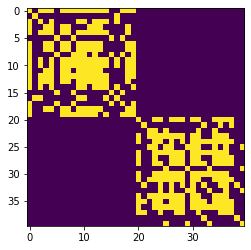

In [50]:
plt.imshow(binary_mat2)

In [51]:
G = nx.from_numpy_array(binary_mat2)

In [52]:
list(nx.connected_components(G))

[{0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19},
 {20,
  21,
  22,
  23,
  24,
  25,
  26,
  27,
  28,
  29,
  30,
  31,
  32,
  33,
  34,
  35,
  36,
  37,
  38,
  39}]

## functions

In [53]:
def l2_dist_matrix(X_array, Y_array = None):
    # checks / definitions
    
    if Y_array is None:
        Y_array = X_array.copy()
    
    assert X_array.shape[1:] == Y_array.shape[1:], \
        "X_array and Y_array's matrix structure should be the same dimensions"
    
    n = X_array.shape[0]
    m = Y_array.shape[0]
    dmat = np.zeros((n, m))
    
    for r_idx in np.arange(n):
        dmat[r_idx,:] = l2_dist_lots2one(X_array[r_idx], Y_array)
        
    return dmat

def test_l2_dist_matrix():
    """
    test l2_dist_matrix (basic) 
    """
    np.random.seed(2)
    X_array = np.random.uniform(size = 5*3*4).reshape((5,3,4))
    X_array2 = X_array[1:3]

    square = l2_dist_matrix(X_array)

    assert np.all(square == square.T) and np.all(np.diag(square) == 0) and \
        np.all(square >=0), \
        "expected square matrix is symmetric, and diags are 0, as non-neg"

    partial = l2_dist_matrix(X_array2, X_array)

    assert np.all(square[1:3] == partial), \
        "slicing of data into the l2_dist_matrix works correctly"
    
test_l2_dist_matrix()

In [61]:
# utility
def check_character_percent(x, name = "x"):
    assert len(re.findall("%$", x)) == 1, \
        f"if {name!r} is a character it must be '__%'."
    
    percentage = float(re.sub("%","", x))/100

    assert percentage <= 1 and percentage > 0, \
        f"if {name!r} is entered as a percent, " +\
        "it must be a percentage <= 100% and " +\
        "greater than 0%"
    
    return percentage

def test_check_character_precent():
    assert check_character_percent("100%", "x") == 1, \
        "expect 100% to translate to 1.0"
    
    assert np.abs(check_character_percent("99.99%", "x") - .9999) < 1e-07, \
        "expect 99.99% to translate to .9999"
    
    correct_error0 = False
    try: 
        check_character_percent("0%", "x")
    except AssertionError:
        correct_error0 = True
    
    assert correct_error0, \
        "0% should error in check_character_percent, but didn't "+\
        "(or didn't with an AssertionError)"
    
    
    correct_error_double_point = False
    try: 
        check_character_percent(".99.99%", "x")
    except ValueError:
        correct_error_double_point = True
    
    assert correct_error0, \
        ".99.99% should error in check_character_percent, but didn't "+\
        "(or didn't with an ValueError)"
    
test_check_character_precent()

In [55]:
def mode_clustering(X_array, sigma, eps=1e-07, maxT = 50, diff_eps = 1e-07, 
                    parallel = 1, verbose = True):
    """
    Find mode clusters of multivariate functional objects 

    Arguments:
    ----------
    X_array: numpy array (r, n, p). Each row has a single representation of a 
        multivariate function in it.
    sigma: scalar, scale value for the distances between observations
    eps: scalar, if difference between steps is less than this - treat as 
        if the point has converged
    maxT: integer, max number of iterations of the algorithm
    diff_eps: scalar, if the final step of each of the points is within
        this distance from each-other they will be grouped together.
    parallel: boolean, if we should parallelize the meanshift algorithm part
    verbose:  boolean, if we should show progress 

    Returns:
    --------
    a tuple of
        - integer of the number of groups there are
        - pd DataFrame with indices of X_array's rows (in column "index") and a 
            grouping index for each observation (in column "group")
    """
    
    # meanshift
    out_t, out_G_array = meanshift_multidim_funct(X_array = X_array,
                                                 sigma = sigma,
                                                 eps = eps,
                                                 maxT = maxT,
                                                 parallel = parallel,
                                                 verbose = verbose)
    
    # distance between converged-to functions
    dist_mat = l2_dist_matrix(out_G_array)
    
    # graph based analysis
    binary_mat = 1*(dist_mat < diff_eps) # thresholding graph connections
    G = nx.from_numpy_array(binary_mat)
    
    group_info = list(nx.connected_components(G))
    n_groups = len(group_info)
    
    # grouping DF creation
    grouping = []
    indices = []
    for g_idx, g_set in enumerate(group_info):
        grouping = grouping + [g_idx]*len(g_set)
        indices = indices + list(g_set)
        
    pd_out = pd.DataFrame(data = {"index": indices,
                                  "group": grouping},
                         columns = ["index", "group"])
    
    return n_groups, pd_out
    

In [56]:
def test_mode_clustering():
    # data creation: 
    np.random.seed(1)

    z1 = np.array([
        [8.83,8.89,8.81,8.87,8.9,8.87],
        [8.89,8.94,8.85,8.94,8.96,8.92],
        [8.84,8.9,8.82,8.92,8.93,8.91],
        [8.79,8.85,8.79,8.9,8.94,8.92],
        [8.79,8.88,8.81,8.9,8.95,8.92],
        [8.8,8.82,8.78,8.91,8.94,8.92],
        [8.75,8.78,8.77,8.91,8.95,8.92],
        [8.8,8.8,8.77,8.91,8.95,8.94],
        [8.74,8.81,8.76,8.93,8.98,8.99],
        [8.89,8.99,8.92,9.1,9.13,9.11],
        [8.97,8.97,8.91,9.09,9.11,9.11],
        [9.04,9.08,9.05,9.25,9.28,9.27],
        [9,9.01,9,9.2,9.23,9.2],
        [8.99,8.99,8.98,9.18,9.2,9.19],
        [8.93,8.97,8.97,9.18,9.2,9.18]
    ])

    # single grouping
    shifts_vec_p = np.random.choice(np.random.normal(size = 100, scale = .25), 
                                    replace = False, size = 100)

    z_p = np.concatenate([(z1+shifts_vec_p[i]).reshape(1,z1.shape[0], z1.shape[1])
                             for i in np.arange(shifts_vec_p.shape[0])])
    
    dist_mat = l2_dist_matrix(z_p)
    sigma = np.quantile(dist_mat.ravel(), .45)
    
    n_groups, pd_out = mode_clustering(X_array = z_p, sigma = sigma,
                                      eps = 1e-15, maxT = 150, diff_eps = 1e-05,
                                      parallel = 1,
                                      verbose = False)
    
    assert n_groups == 1 and np.all(pd_out.group == 0), \
        "for simple example, expected the number of clusters to be 1"

    idx_values = np.array(list(set(pd_out.index)))
    idx_values.sort()
    assert np.all(idx_values == np.arange(100, dtype = int)), \
        "index structure in returned pd_out isn't correct"
    
    # 2 groups 
    np.random.seed(2022)

    shifts_vec2 = np.random.choice(np.random.uniform(size = 30)+ np.array([0]*15+[-2]*15), 
                                  replace = False, size = 30)

    z_multi2 = np.concatenate([(z1+shifts_vec2[i]).reshape(1,z1.shape[0], z1.shape[1])
                             for i in np.arange(shifts_vec2.shape[0])])
    
    dist_mat2 = l2_dist_matrix(z_multi2)
    sigma2 = np.quantile(dist_mat2.ravel(), .45)
    
    n_groups2, pd_out2 = mode_clustering(X_array = z_multi2, sigma = sigma2,
                                      eps = 1e-15, maxT = 100, diff_eps = 1e-05,
                                      parallel = 1,
                                      verbose = False)
    
    assert n_groups2 == 2 and np.all([x in [0,1] for x in pd_out.group]), \
        "for simple example (2 groups), expected the number of clusters to be 2"
    
    idx_values2 = np.array(list(set(pd_out2.index)))
    idx_values2.sort()
    assert np.all(idx_values2 == np.arange(idx_values2.shape[0], dtype = int)), \
        "index structure in returned pd_out2 isn't correct"
    
test_mode_clustering()

In [57]:
def mode_clustering_check(X_array, sigma, eps_vec=np.array([1e-07]), 
                          maxT = 50, diff_eps_vec = np.array([1e-07]), 
                          parallel = 1, verbose = True):
    """
    Inner tuning across different values of eps and diff_eps to identify the
        number of mode clusters for multivariate functional objects 

    Arguments:
    ----------
    X_array: numpy array (r, n, p). Each row has a single representation of a 
        multivariate function in it.
    sigma: scalar, scale value for the distances between observations
    eps_vec: numpy array (e, ) The range of eps values to look across. Where a 
        single eps value determines when to stop stepping up the psuedo-density
        if the step before is less than eps away from the current step 
        (suggests convergence)
    maxT: integer, max number of iterations of the meanshift algorithm
    diff_eps_vec: numpy array (d, ) The range of diff_eps values to look across.
        Where a single diff_eps value determines if the distance between a pair
        of converged points is small enough to suggest they should be in the 
        same group
    parallel: boolean, if we should parallelize the meanshift algorithm part
    verbose:  boolean, if we should show progress 

    Returns:
    --------
    a matrix (e, d) of integers of the number of mode clusters observed with 
    paramters eps_vec[e] and diff_eps_vec[d]
    """
    
    info_mat = -1 * np.ones((eps_vec.shape[0], diff_eps_vec.shape[0]))

    
    eps_vec.sort()
    diff_eps_vec.sort()
    
    eps_list = list(eps_vec.copy())
    diff_eps_list = list(diff_eps_vec.copy()[::-1])
        
    out_G_array = X_array.copy()
    maxT_vec = np.array([maxT]*X_array.shape[0])
    
    eps_index = 0
    while np.min(maxT_vec) > 0 and len(eps_list) > 0:

        # EPS part
        eps = eps_list.pop() # will grab largest value (which is at the end...)
        # 
        out_t, out_G_array = meanshift_multidim_funct(X_array = X_array,
                                                      G_array = out_G_array,
                                                     sigma = sigma,
                                                     eps = eps,
                                                     maxT = maxT_vec,
                                                     parallel = parallel,
                                                     verbose = verbose)
        
        
        maxT_vec = maxT_vec - (out_t + 1) # since out_t is 0 indexed (but maxT_vec isn't)
        
        # DIFF_EPS part
        for diff_eps_index, diff_eps in enumerate(diff_eps_list):
            
            dist_mat = l2_dist_matrix(out_G_array)
    
            # graph based analysis
            binary_mat = 1*(dist_mat < diff_eps) # thresholding graph connections
            G = nx.from_numpy_array(binary_mat)

            group_info = list(nx.connected_components(G))
            info_mat[eps_index, diff_eps_index] = len(group_info)
        
        eps_index += 1
        
    return info_mat 

In [58]:
def test_mode_clustering_check():
    # data creation: 

    z1 = np.array([
        [8.83,8.89,8.81,8.87,8.9,8.87],
        [8.89,8.94,8.85,8.94,8.96,8.92],
        [8.84,8.9,8.82,8.92,8.93,8.91],
        [8.79,8.85,8.79,8.9,8.94,8.92],
        [8.79,8.88,8.81,8.9,8.95,8.92],
        [8.8,8.82,8.78,8.91,8.94,8.92],
        [8.75,8.78,8.77,8.91,8.95,8.92],
        [8.8,8.8,8.77,8.91,8.95,8.94],
        [8.74,8.81,8.76,8.93,8.98,8.99],
        [8.89,8.99,8.92,9.1,9.13,9.11],
        [8.97,8.97,8.91,9.09,9.11,9.11],
        [9.04,9.08,9.05,9.25,9.28,9.27],
        [9,9.01,9,9.2,9.23,9.2],
        [8.99,8.99,8.98,9.18,9.2,9.19],
        [8.93,8.97,8.97,9.18,9.2,9.18]
    ])

    # single groups -------------
    np.random.seed(1)

    shifts_vec_p = np.random.choice(np.random.normal(size = 100, scale = .25), 
                                    replace = False, size = 100)

    z_p = np.concatenate([(z1+shifts_vec_p[i]).reshape(1,z1.shape[0], z1.shape[1])
                             for i in np.arange(shifts_vec_p.shape[0])])
    
    dist_mat = l2_dist_matrix(z_p)
    sigma = np.quantile(dist_mat.ravel(), .6)
    

    n_groups = mode_clustering_check(X_array = z_p, sigma = sigma,
                                      eps_vec = np.array([1e-01,1e-05, 1e-10, 1e-15]), 
                                      maxT = 30, 
                                      diff_eps_vec = np.array([1e-03,1e-05,1e-08]),
                                      parallel = 1,
                                      verbose = False)
    
    n_groups2 = mode_clustering_check(X_array = z_p, sigma = sigma,
                                      eps_vec = np.array([1e-01,1e-05, 1e-10, 1e-15]), 
                                      maxT = 150, 
                                      diff_eps_vec = np.array([1e-03,1e-05,1e-08]),
                                      parallel = 1,
                                      verbose = False)

    
    non_negative_rows_small = np.sum((n_groups == -1).sum(axis = 1) == 0)
    
    assert np.all(n_groups[:(non_negative_rows_small-1)] == \
        n_groups2[:(non_negative_rows_small-1)]), \
        "if maxT is large enough, eps outcomes should match given rest same"
    
    number_n1 =  (n_groups == -1).sum(axis = 1)
    number_n1_sorted = number_n1.copy()
    number_n1_sorted.sort()
    
    assert np.all(number_n1 == number_n1_sorted), \
        "number of negative values in matrix is "+\
        "monotonically increasing as eps decrease"
    
    # row values leq as we go down
    for r_idx in np.arange(n_groups.shape[0]-1):
        assert np.all(n_groups[r_idx] >= n_groups[r_idx+1]), \
            "row i's values should be less than row (i+1)'s' [smaller]"
        assert np.all(n_groups2[r_idx] >= n_groups2[r_idx+1]), \
            "row i's values should be less than row (i+1)'s' [larger]"
        
    # column values geq as we go right
    for c_idx in np.arange(n_groups.shape[1]-1):
        assert np.all(n_groups[:,c_idx] <= n_groups[:,c_idx+1]), \
            "column j's values should be less than row (j+1)'s' [smaller]"
        assert np.all(n_groups2[:,c_idx] <= n_groups2[:,c_idx+1]), \
            "row i's values should be less than row (i+1)'s' [larger]"
        
    assert np.all(n_groups2[-1] == 1), \
        "should find only a single group with highest eps"
    
    # 2 groups -------------------
    
    shifts_vec_p2 = np.random.choice(
                        np.concatenate(
                            [np.random.normal(size = 50, 
                                              scale = .25, loc = -2),
                             np.random.normal(size = 50, 
                                              scale = .25, loc = 2),
                            ]), 
                                    replace = False, size = 100)

    z_p2 = np.concatenate([(z1+shifts_vec_p2[i]).reshape(1,z1.shape[0], z1.shape[1])
                             for i in np.arange(shifts_vec_p2.shape[0])])
    
    dist_mat2 = l2_dist_matrix(z_p2)
    sigma2 = np.quantile(dist_mat2.ravel(), .6)
    

    n_groups_2 = mode_clustering_check(X_array = z_p2, sigma = sigma2,
                                      eps_vec = np.array([1e-01,1e-05, 1e-10, 1e-15]), 
                                      maxT = 30, 
                                      diff_eps_vec = np.array([1e-03,1e-05,1e-08]),
                                      parallel = 1,
                                      verbose = False)
    
    n_groups2_2 = mode_clustering_check(X_array = z_p2, sigma = sigma2,
                                      eps_vec = np.array([1e-01,1e-05, 1e-10, 1e-15]), 
                                      maxT = 150, 
                                      diff_eps_vec = np.array([1e-03,1e-05,1e-08]),
                                      parallel = 1,
                                      verbose = False)
    
    
    non_negative_rows_small2 = np.sum((n_groups == -1).sum(axis = 1) == 0)
    
    assert np.all(n_groups_2[:(non_negative_rows_small2-1)] == \
        n_groups2_2[:(non_negative_rows_small2-1)]), \
        "if maxT is large enough, eps outcomes should match given rest same"
    
    number_n1_2 =  (n_groups_2 == -1).sum(axis = 1)
    number_n1_sorted_2 = number_n1_2.copy()
    number_n1_sorted_2.sort()
    
    assert np.all(number_n1_2 == number_n1_sorted_2), \
        "number of negative values in matrix is "+\
        "monotonically increasing as eps decrease [2 groups case]"
    
    # row values leq as we go down
    for r_idx in np.arange(n_groups_2.shape[0]-1):
        assert np.all(n_groups_2[r_idx] >= n_groups_2[r_idx+1]), \
            "row i's values should be less than row (i+1)'s' "+\
            "[smaller, 2 groups]"
        assert np.all(n_groups2_2[r_idx] >= n_groups2_2[r_idx+1]), \
            "row i's values should be less than row (i+1)'s' "+\
            "[larger, 2 groups]"
        
    # column values geq as we go right
    for c_idx in np.arange(n_groups_2.shape[1]-1):
        assert np.all(n_groups_2[:,c_idx] <= n_groups_2[:,c_idx+1]), \
            "column j's values should be less than row (j+1)'s' "+\
            "[smaller, 2 groups]"
        assert np.all(n_groups2_2[:,c_idx] <= n_groups2_2[:,c_idx+1]), \
            "row i's values should be less than row (i+1)'s' "+\
            "[larger, 2 groups]"
        
    assert np.all(n_groups2_2[-1] == 2), \
        "should find only 2 groups with highest eps [2 groups]"
 

test_mode_clustering_check()